In [1]:
print("Ejercicio 3")

Ejercicio 3


In [2]:
# Importamos las librerías necesarias
import os
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio  # Para reproducir audio en el notebook
import soundfile as sf  
from scipy.signal import spectrogram,resample


# Definir el nombre del archivo de audio (asegúrate de tener este archivo)
archivo_estereo = 'viola_soundtrack.wav'

# Leemos el archivo de audio
# data contendrá el array con la señal, y samplerate la frecuencia de muestreo (en Hz)
data, samplerate = sf.read(archivo_estereo)

# Obtenemos el número de canales: si la señal tiene más de una dimensión, el segundo eje indica los canales
num_canales = data.shape[1] if data.ndim > 1 else 1

# Calculamos el tamaño del archivo en megabytes (Mb)
tamanio_bytes = os.path.getsize(archivo_estereo)
tamanio_mb = tamanio_bytes / (1024 ** 2)

# Mostramos las características del audio estéreo
print("Audio Estéreo:")
print("Frecuencia de muestreo:", samplerate, "Hz")
print("Número de canales:", num_canales)
print("Tamaño del archivo: {:.2f} Mb".format(tamanio_mb))



Audio Estéreo:
Frecuencia de muestreo: 44100 Hz
Número de canales: 2
Tamaño del archivo: 6.69 Mb


In [3]:
# Mostrar un widget para reproducir el audio estéreo
Audio(archivo_estereo)

In [4]:
# Si el audio es estéreo (más de un canal), se convierte a mono promediando los canales
if num_canales > 1:
    data_mono = np.mean(data, axis=1)  # Promediamos a lo largo del eje de canales
else:
    data_mono = data  # Si ya es mono, no se realiza ningún cambio

# Guardamos el audio mono en un nuevo archivo para poder reproducirlo
archivo_mono = 'viola_soundtrack_mono.wav'
sf.write(archivo_mono, data_mono, samplerate)

# Como la frecuencia de muestreo permanece igual y ahora solo tenemos un canal:
print("\nAudio Mono:")
print("Frecuencia de muestreo:", samplerate, "Hz")
print("Número de canales: 1")
# Para el tamaño del archivo mono, obtenemos el tamaño del nuevo archivo guardado
tamanio_mono_bytes = os.path.getsize(archivo_mono)
tamanio_mono_mb = tamanio_mono_bytes / (1024 ** 2)
print("Tamaño del archivo mono: {:.2f} Mb".format(tamanio_mono_mb))


Audio Mono:
Frecuencia de muestreo: 44100 Hz
Número de canales: 1
Tamaño del archivo mono: 3.35 Mb


In [5]:
print("\nReproducción del audio mono:")
Audio(archivo_mono)


Reproducción del audio mono:


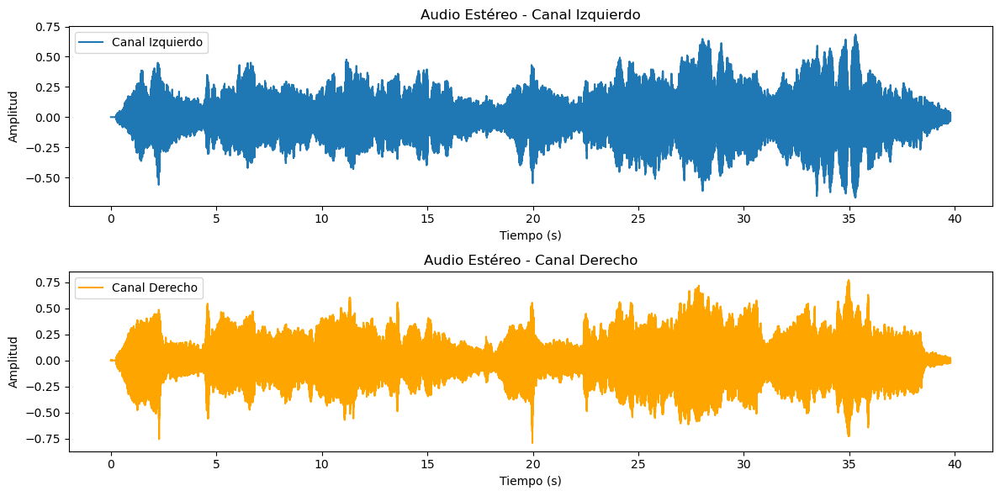

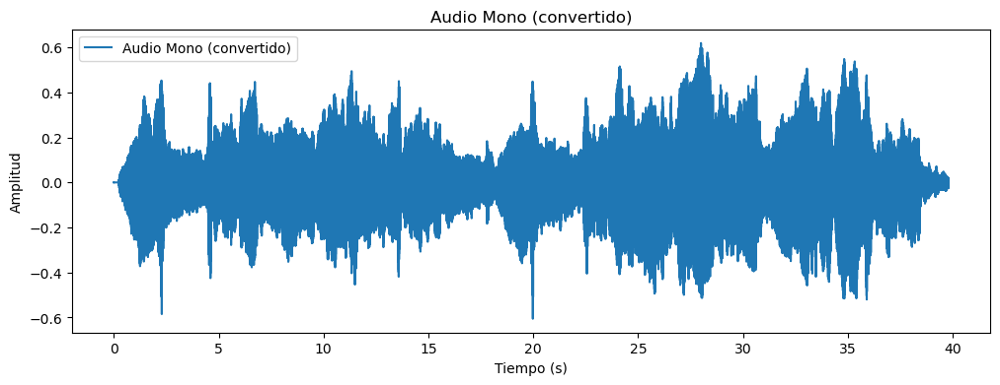

In [6]:
# Creamos un vector de tiempo basado en la duración del audio
tiempo_estereo = np.linspace(0, len(data) / samplerate, num=len(data))

# Graficamos los dos canales del audio estéreo por separado
if num_canales > 1:
    plt.figure(figsize=(12, 6))
    
    # Canal izquierdo
    plt.subplot(2, 1, 1)
    plt.plot(tiempo_estereo, data[:, 0], label='Canal Izquierdo')
    plt.title('Audio Estéreo - Canal Izquierdo')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.legend()
    
    # Canal derecho
    plt.subplot(2, 1, 2)
    plt.plot(tiempo_estereo, data[:, 1], label='Canal Derecho', color='orange')
    plt.title('Audio Estéreo - Canal Derecho')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
else:
    # Si el audio es mono, se grafica una sola señal
    plt.figure(figsize=(12, 4))
    plt.plot(tiempo_estereo, data, label='Audio Mono')
    plt.title('Audio Mono')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.show()

# Graficamos la señal mono convertida
tiempo_mono = np.linspace(0, len(data_mono) / samplerate, num=len(data_mono))
plt.figure(figsize=(12, 4))
plt.plot(tiempo_mono, data_mono, label='Audio Mono (convertido)')
plt.title('Audio Mono (convertido)')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.legend()
plt.show()